In [1]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read all files

In [2]:
#1_trial is a name of a folder containing the cali files, you may create a folder with a different name and replace the folder name here
tk = th.Thicket.from_caliperreader(glob("ProjectCaliper/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 199/199 [00:05<00:00, 33.84it/s]


View Calltree

In [3]:
print(tk.tree(metric_column="Avg time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

353.065 MPI_Comm_dup
0.000 MPI_Finalize
0.000 MPI_Finalized
0.000 MPI_Initialized
137.567 main
├─ 136.915 comm
│  └─ 136.915 comm_small
│     ├─ 131.382 MPI_Recv
│     └─ 4.367 MPI_Send
├─ 0.077 comp
│  ├─ 16.572 comp_large
│  └─ 0.013 comp_small
├─ 0.355 correctness_check
└─ 0.568 data_init_runtime

Legend (Metric: Avg time/rank Min: 0.00 Max: 353.07 indices: {'profile': 4697770})
█ 317.76 - 353.07
█ 247.15 - 317.76
█ 176.53 - 247.15
█ 105.92 - 176.53
█ 35.31 - 105.92
█ 0.00 - 35.31

name User code    ◀  Only in left graph    ▶  Only in right graph



Group Performance data by `matrix_size` in the Thicket metadata table.

In [4]:
tk.metadata_column_to_perfdata("num_procs")
tk.metadata_column_to_perfdata("input_size")
tk.metadata_column_to_perfdata("input_type")
tk.metadata_column_to_perfdata("algorithm")

tk.dataframe = tk.dataframe.reset_index().set_index(["node", "num_procs", "input_size", "input_type", "algorithm"]).sort_index()

tk.dataframe

profile  \
node                                              num_procs input_size input_type   algorithm               
{'name': 'MPI_Comm_dup', 'type': 'function'}      2         65536      1% Perturbed column      231871838   
                                                                       Random       column      158387172   
                                                                       Reverse      column     3889632798   
                                                                       Sorted       column     2286539475   
                                                            262144     1% Perturbed column     3665066001   
                                                                       Random       column     1390143986   
                                                                       Reverse      column     1623831777   
                                                                       Sorted       column     2721075691   
                                                            1048576    1% Perturbed column     2615227208   
                                                                       Random       column     4229539793   
                                                                       Reverse      column      898925976   
                                                                       Sorted       column     3896526822   
                                                            4194304    1% Perturbed column     1375860126   
                                                                       Random       column     2783637368   
                                                                       Reverse      column      851274732   
                                                                       Sorted       column     4211791346   
                                                            16777216   1% Perturbed column     3643716056   
                                                                       Random       column     3227450155   
                                                                       Reverse      column      564257846   
                                                                       Sorted       column     3835168928   
                                                            67108864   1% Perturbed column     1804546529   
                                                                       Random       column     3225969736   
                                                                       Reverse      column     4101827708   
                                                                       Sorted       column       45536892   
                                                            268435456  1% Perturbed column     2827678367   
                                                                       Random       column     2341770347   
                                                                       Reverse      column     3167379752   
                                                                       Sorted       column     3906612036   
                                                  4         65536      1% Perturbed column       30556530   
                                                                       Random       column     3453979612   
                                                                       Reverse      column     2201205457   
                                                                       Sorted       column     3333156775   
                                                            262144     1% Perturbed column      249107561   
                                                                       Random       column      222267407   
                                                                       Reverse      column      735906150   
                                                                 

In [5]:
# Define common variables
processes = [2, 4, 8, 16, 32, 64, 128, 256] 
zeros = [0, 0, 0, 0, 0, 0, 0, 0]
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456] 
inputs = ["Random", "Reverse", "Sorted", "1% Perturbed"]

In [6]:
# Change font size for all plots
plt.rcParams.update({"font.size": 20})

In [7]:
def plot_pandas(df, title, xlabel, ylabel):
    plot = df.plot(kind="line",
        marker='o',
        title=title,
        xlabel=xlabel,
        ylabel=ylabel,
        figsize=(15,7)
    )
    print(title)
    return plot

main_65536
main_262144
main_1048576
main_4194304
main_16777216
main_67108864
main_268435456


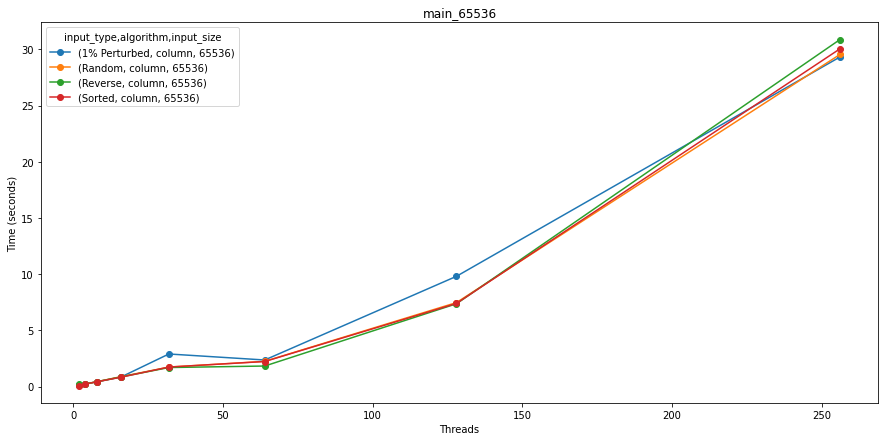

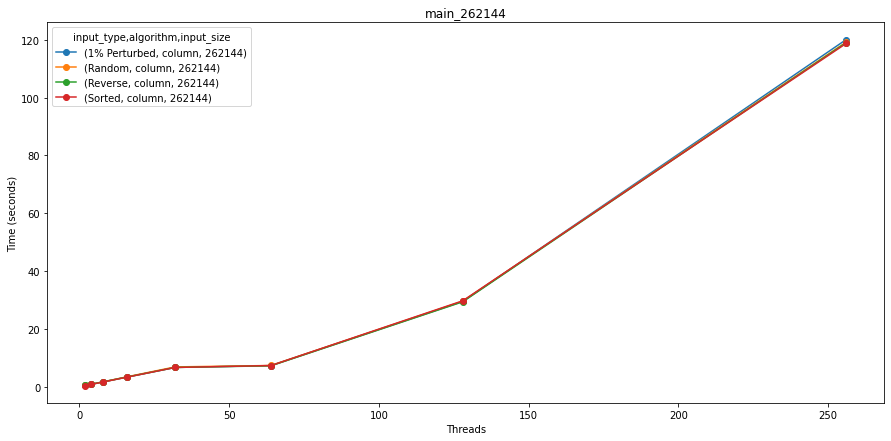

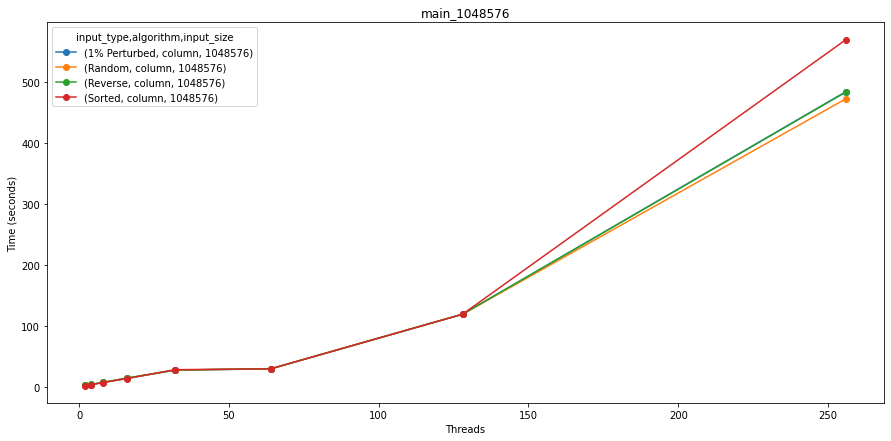

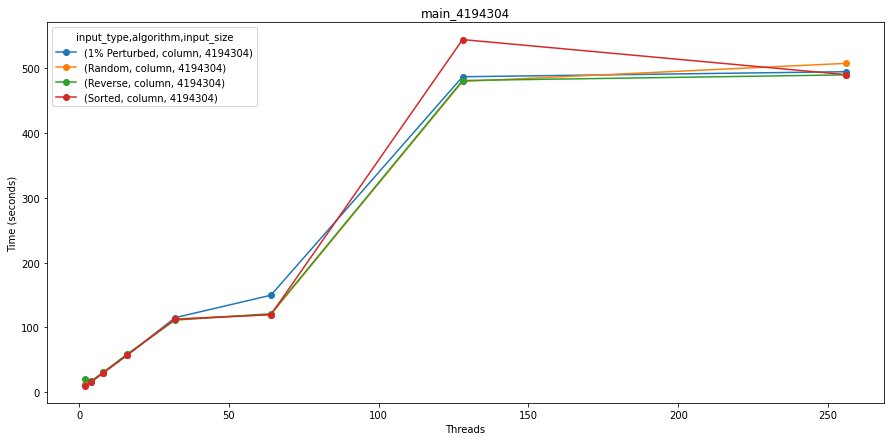

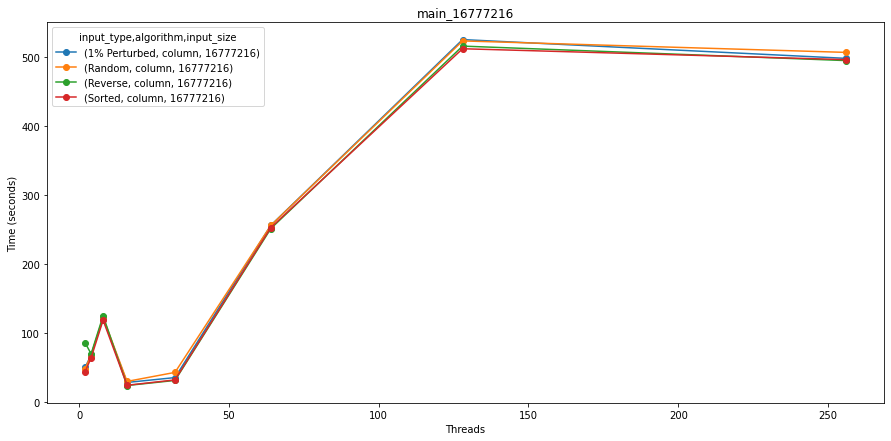

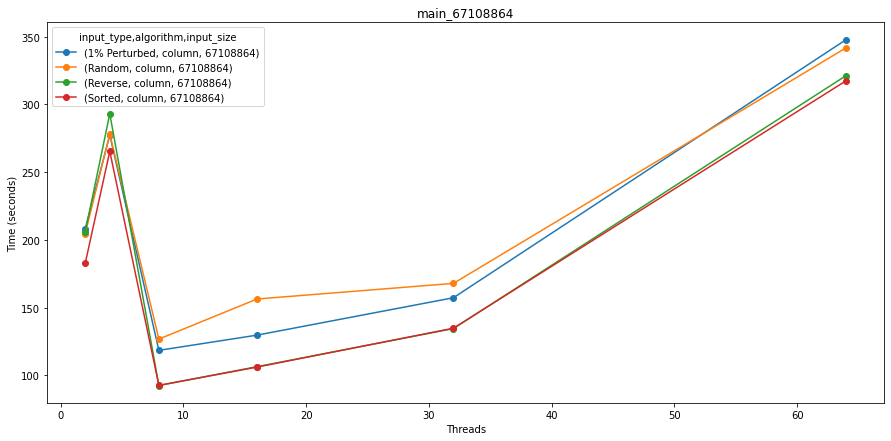

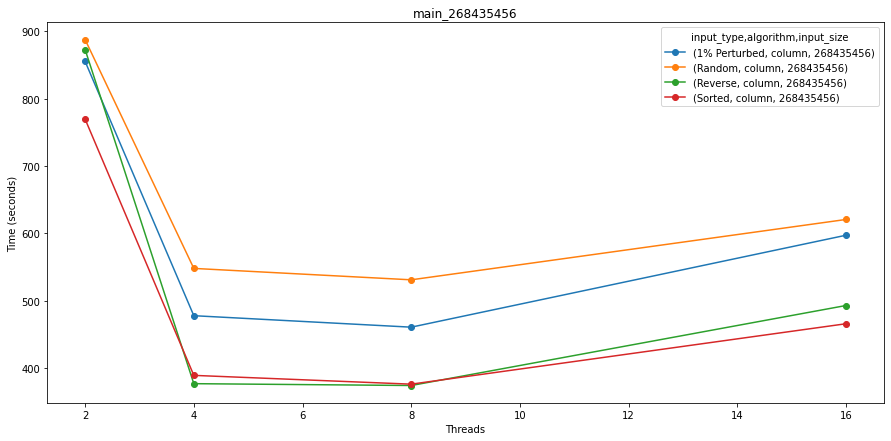

In [34]:
for node in tk.graph.traverse():
    if 'main' in str(node):
        for size in input_sizes:
            df=(tk.dataframe.loc[node, "Max time/rank"])
            df = (df.loc[df.index.get_level_values('input_size') == size])
            df = df.unstack(level="input_type")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_size")
            plot_pandas(
                df,
                title=str(node.frame["name"])+"_"+str(size),
                xlabel="Threads",
                ylabel="Time (seconds)",
            )
            plt.savefig(str(node.frame["name"])+"_"+str(size)+'.png', dpi=300, bbox_inches='tight')

comp_large_65536
comp_large_262144
comp_large_1048576
comp_large_4194304
comp_large_16777216
comp_large_67108864
comp_large_268435456


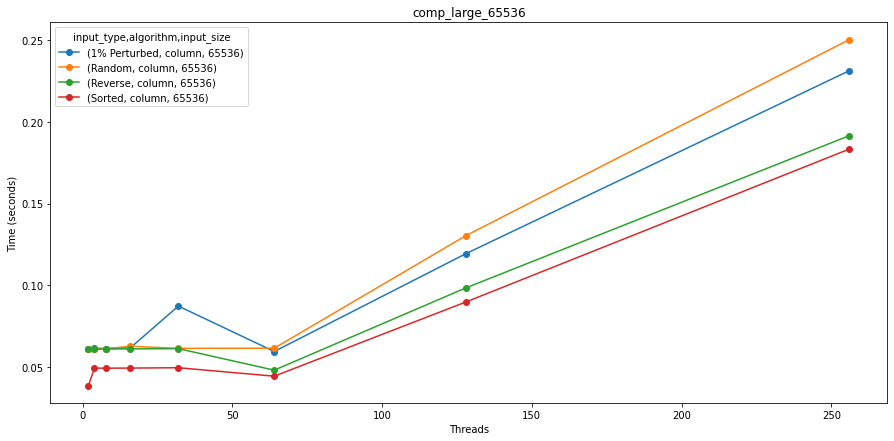

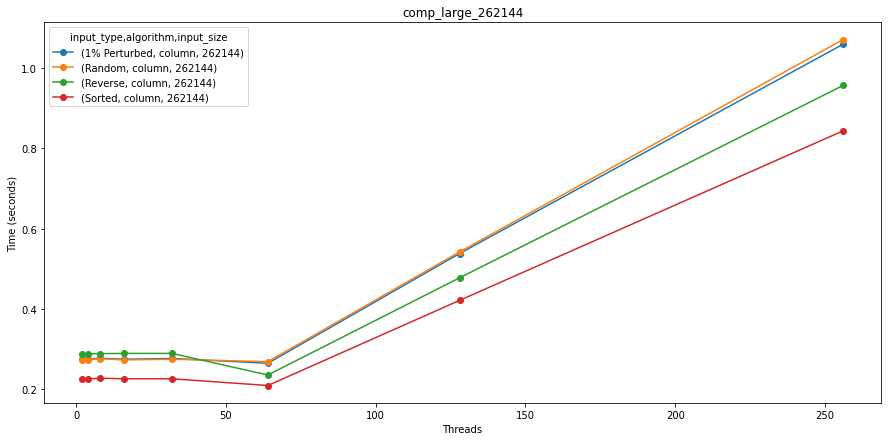

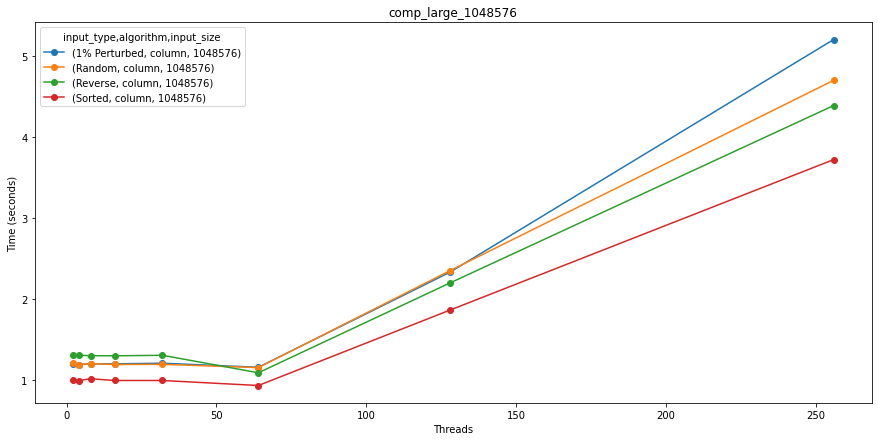

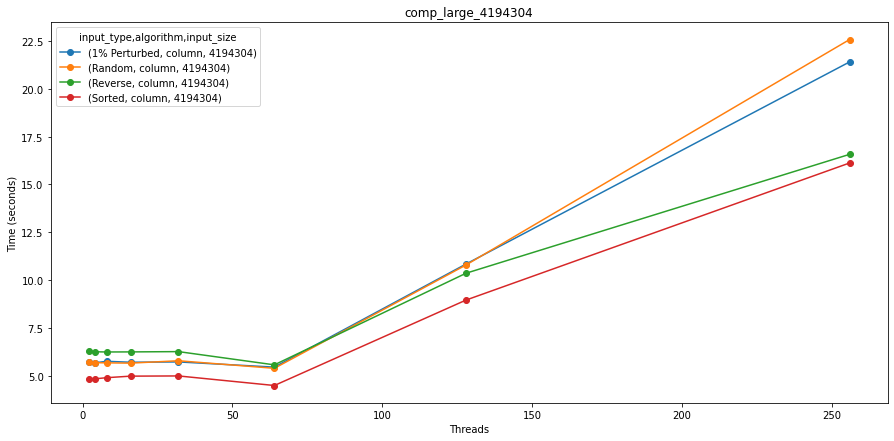

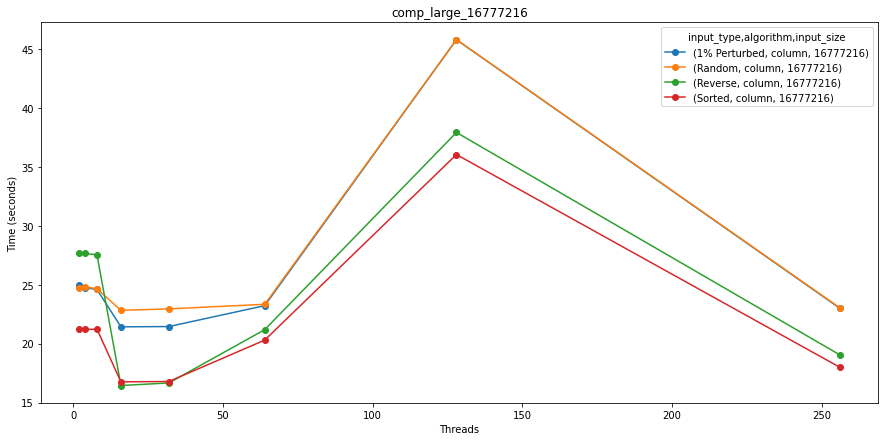

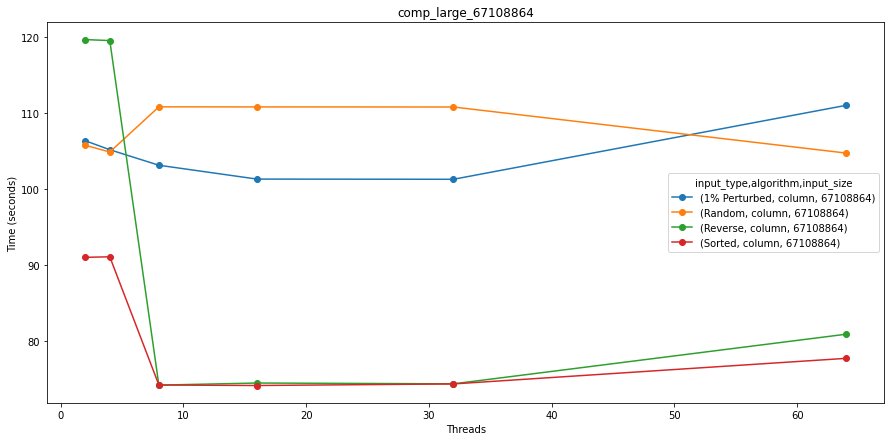

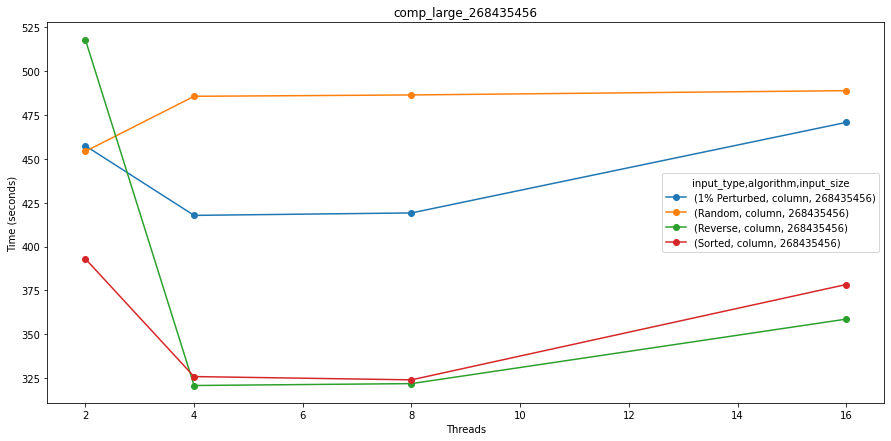

In [35]:
for node in tk.graph.traverse():
    if 'comp_large' in str(node):
        for size in input_sizes:
            df=(tk.dataframe.loc[node, "Avg time/rank"])
            df = (df.loc[df.index.get_level_values('input_size') == size])
            df = df.unstack(level="input_type")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_size")
            plot_pandas(
                df,
                title=str(node.frame["name"])+"_"+str(size),
                xlabel="Threads",
                ylabel="Time (seconds)",
            )
            plt.savefig(str(node.frame["name"])+"_"+str(size)+'.png', dpi=300, bbox_inches='tight')

comm_65536
comm_262144
comm_1048576
comm_4194304
comm_16777216
comm_67108864
comm_268435456


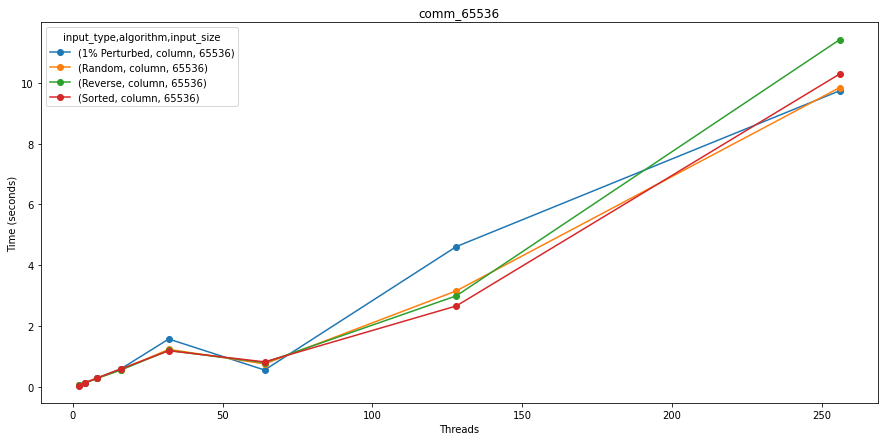

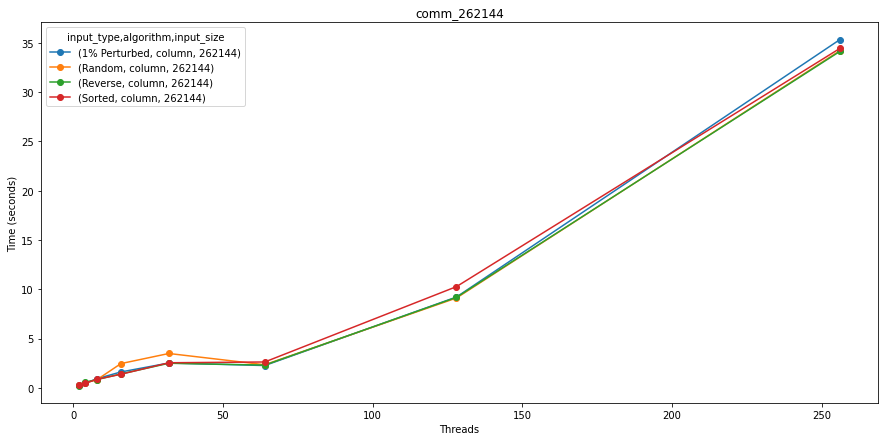

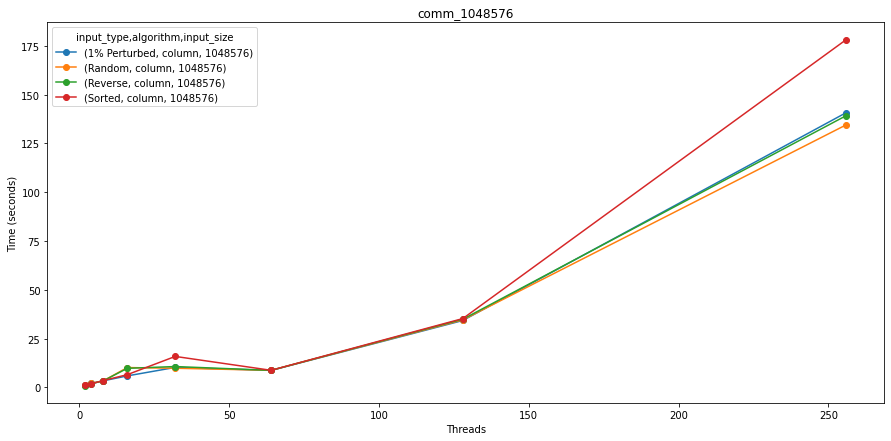

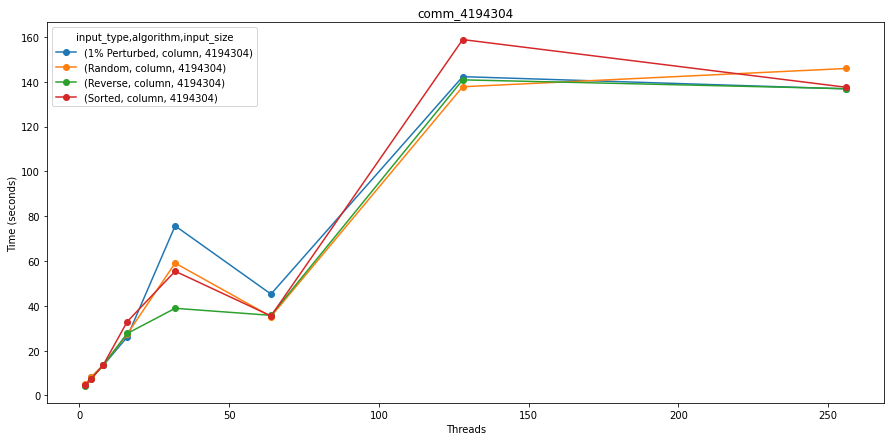

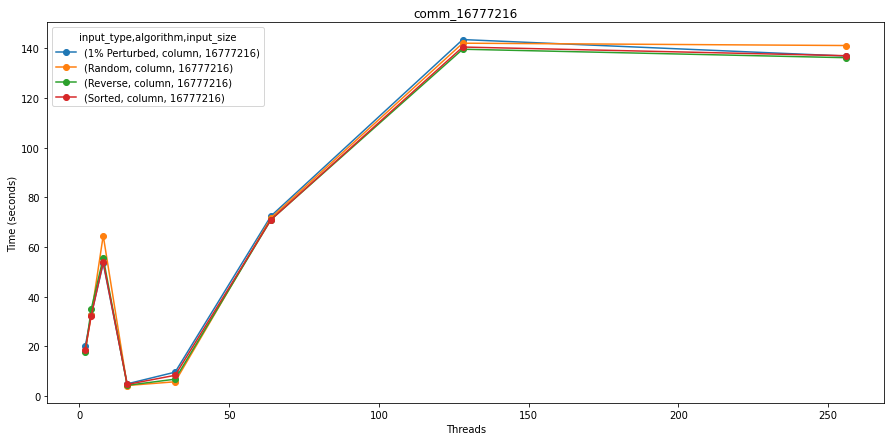

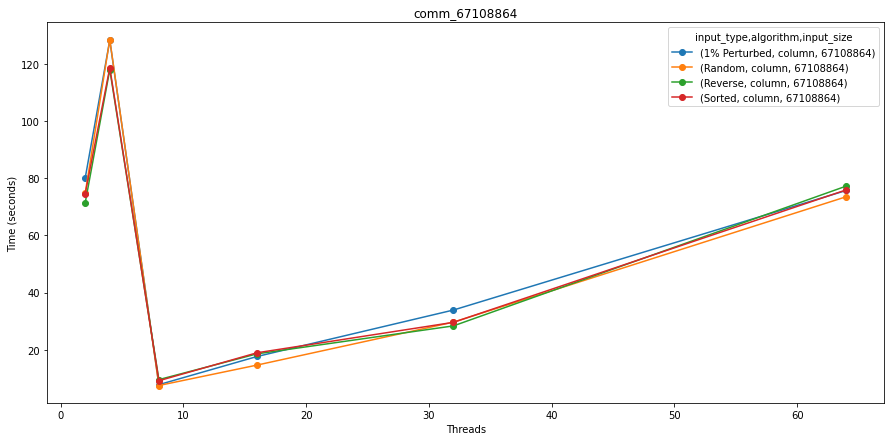

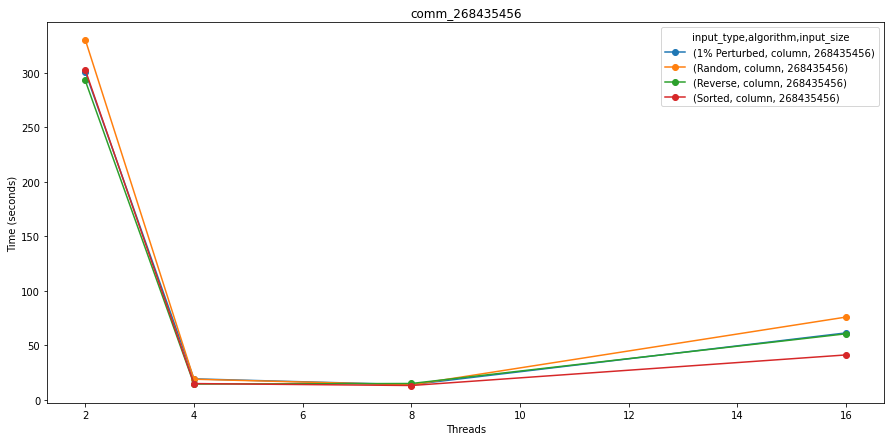

In [36]:
for node in tk.graph.traverse(): 
    if 'comm\',' in str(node):
        for size in input_sizes:
            df=(tk.dataframe.loc[node, "Avg time/rank"])
            df = (df.loc[df.index.get_level_values('input_size') == size])
            df = df.unstack(level="input_type")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_size")
            plot_pandas(
                df,
                title=str(node.frame["name"])+"_"+str(size),
                xlabel="Threads",
                ylabel="Time (seconds)",
            )
            plt.savefig(str(node.frame["name"])+"_"+str(size)+'.png', dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216   67108864   \
algorithm     column    column    column    column    column     column   
input_type    Random    Random    Random    Random    Random     Random   
num_procs                                                                 
2           1.000000  1.000000  1.000000  1.000000  1.000000   1.000000   
4           0.479307  0.594651  0.584175  0.607244  0.560700   0.582673   
8           0.223022  0.358515  0.355913  0.363299  0.282357  10.022525   
16          0.114215  0.120960  0.117955  0.181348  4.281296   5.122236   
32          0.051621  0.085452  0.122115  0.083942  3.166407   2.526224   

input_size  268435456  
algorithm      column  
input_type     Random  
num_procs              
2            1.000000  
4           17.307288  
8           23.722672  
16           4.343407  
32                NaN  
Strong Scaling Speedup - comm_Random
input_size 65536     262144    1048576   4194304   16777216  67108864  

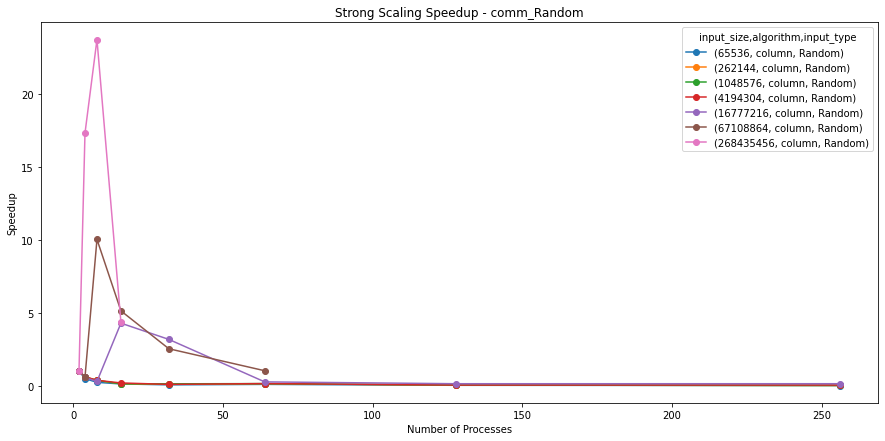

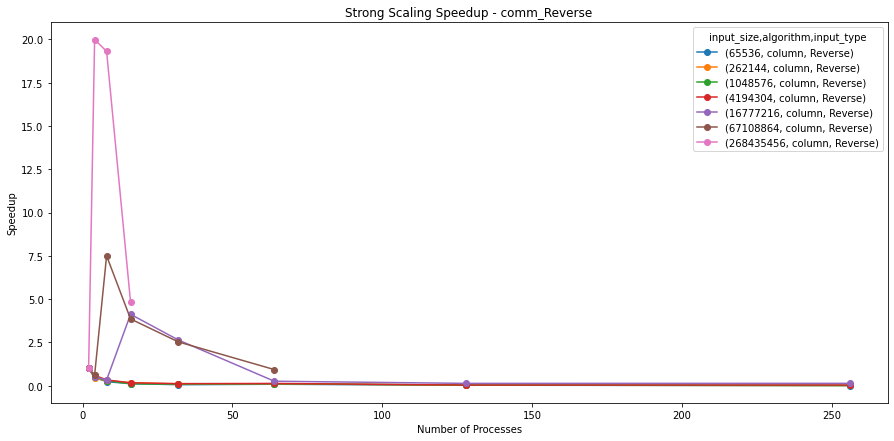

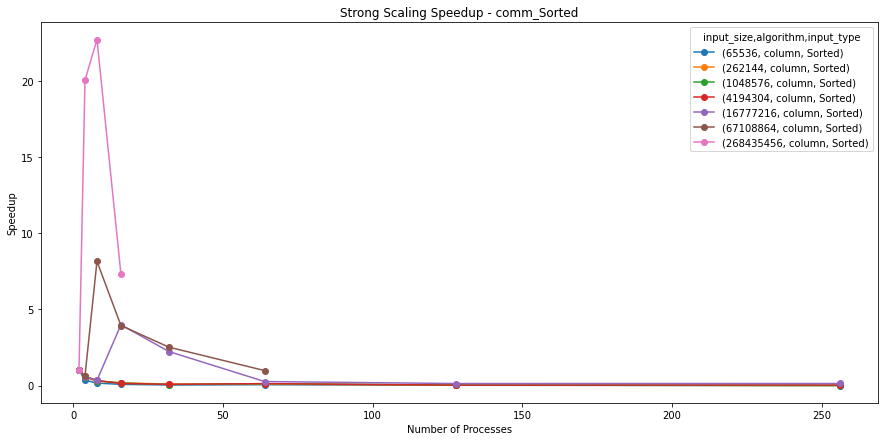

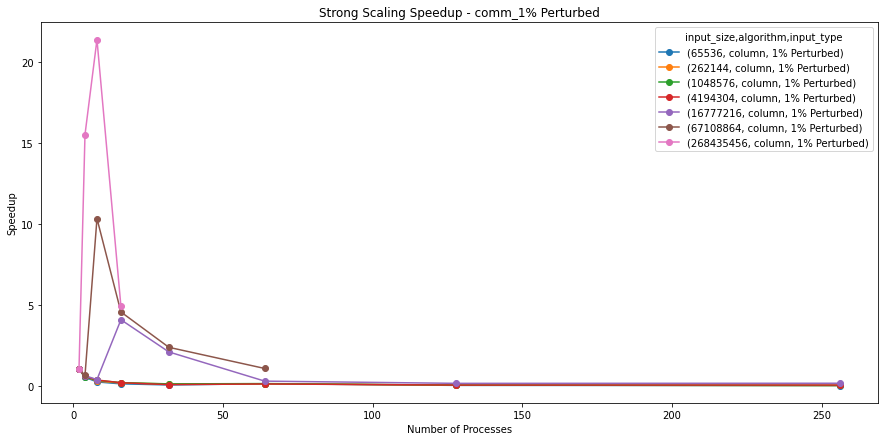

In [37]:
# Strong Scaling
for node in tk.graph.traverse():
    if 'comm\',' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify

            # Plotting the speedup
            plot_pandas(
                speedup,
                title=f"Strong Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Speedup",
            )
            plt.savefig(f"Strong Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     column    column    column    column    column    column   
input_type    Random    Random    Random    Random    Random    Random   
num_procs                                                                
2           1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
4           0.687940  0.821038  0.831255  0.883304  0.864228  0.903207   
8           0.359907  0.558296  0.574680  0.612861  0.517876  5.554878   
16          0.190011  0.198705  0.201667  0.323582  5.466651  5.529460   
32          0.086747  0.141425  0.209735  0.152285  4.707043  4.181823   

input_size 268435456  
algorithm     column  
input_type    Random  
num_procs             
2           1.000000  
4           3.611161  
8           6.593135  
16          5.286510  
32               NaN  
Strong Scaling Speedup - main_Random
input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     c

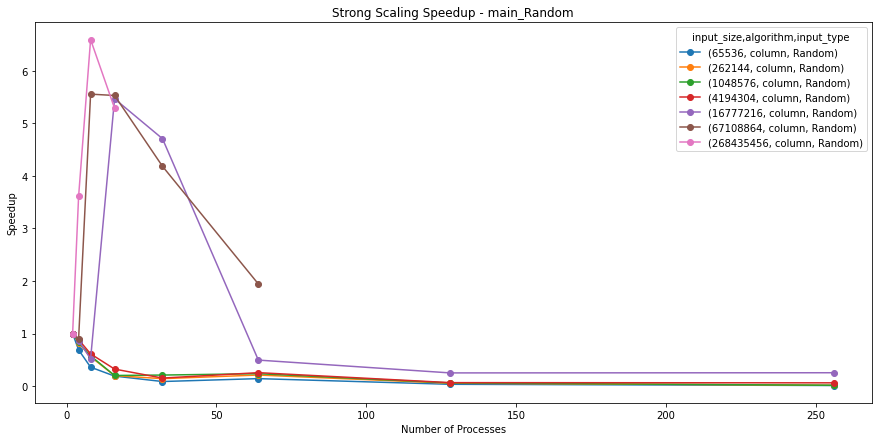

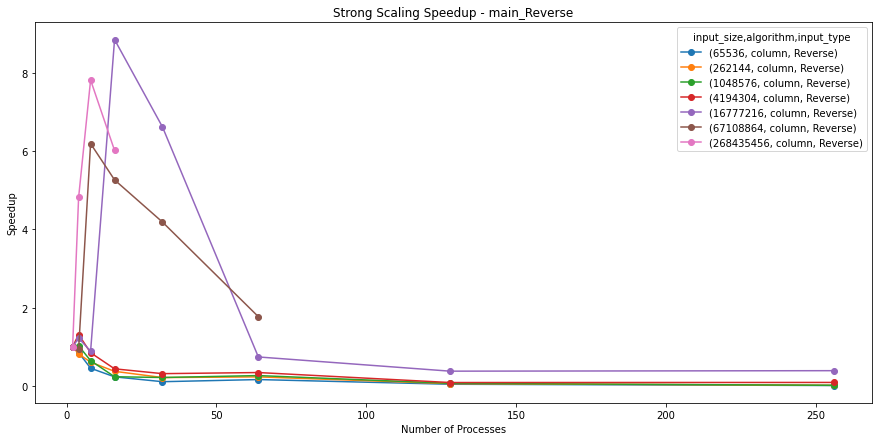

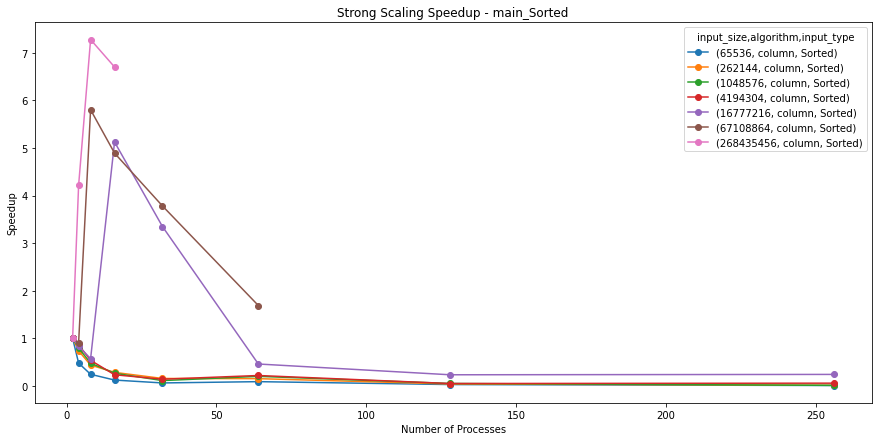

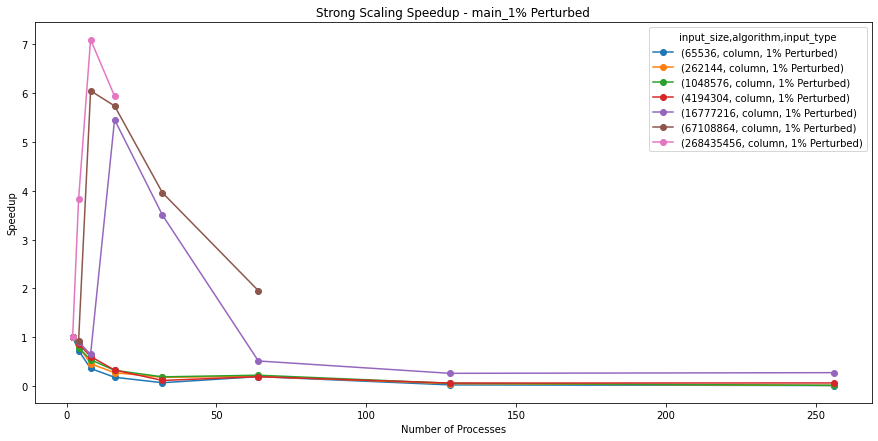

In [38]:
for node in tk.graph.traverse():
    if 'main' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify

            # Plotting the speedup
            plot_pandas(
                speedup,
                title=f"Strong Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Speedup",
            )
            plt.savefig(f"Strong Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     column    column    column    column    column    column   
input_type    Random    Random    Random    Random    Random    Random   
num_procs                                                                
2           1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
4           0.999853  1.002151  1.012822  1.004032  0.995882  1.008493   
8           1.000865  0.991816  1.001048  1.005470  1.002627  0.954334   
16          0.977679  1.002346  1.010821  1.008156  1.082983  0.954416   
32          0.998421  0.996442  1.009242  0.986429  1.077240  0.954512   

input_size 268435456  
algorithm     column  
input_type    Random  
num_procs             
2           1.000000  
4           0.935374  
8           0.933887  
16          0.929218  
32               NaN  
Strong Scaling Speedup - comp_large_Random
input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm

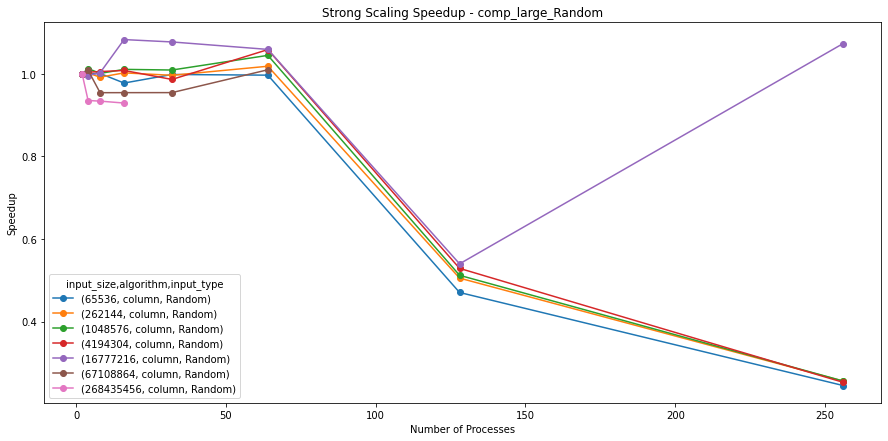

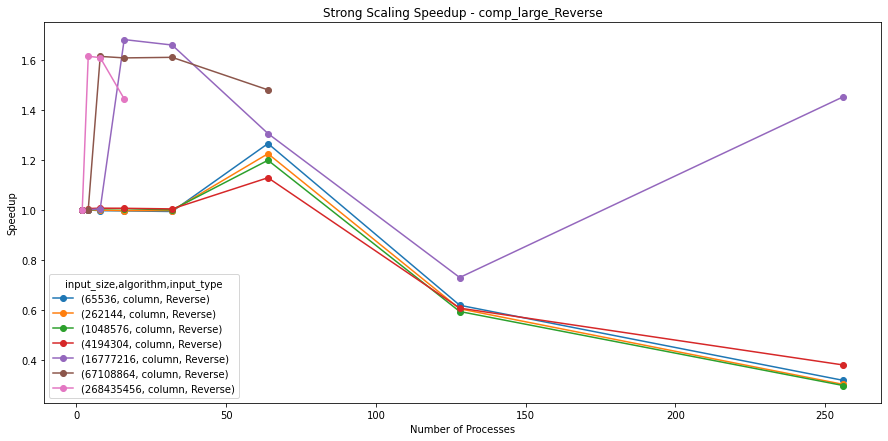

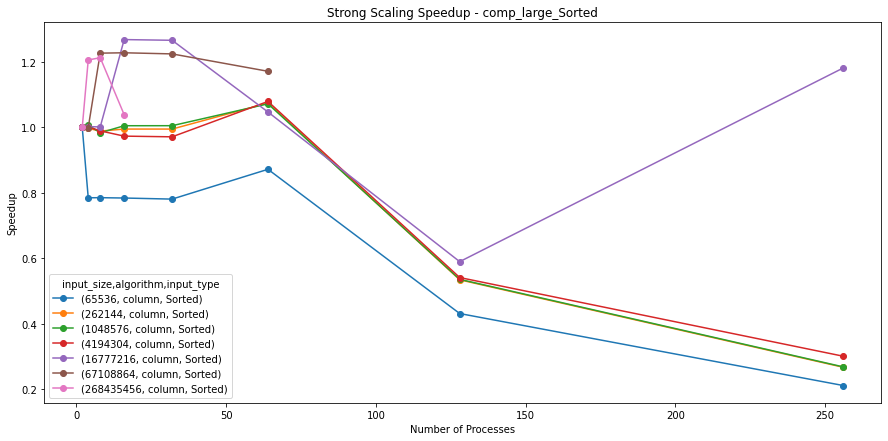

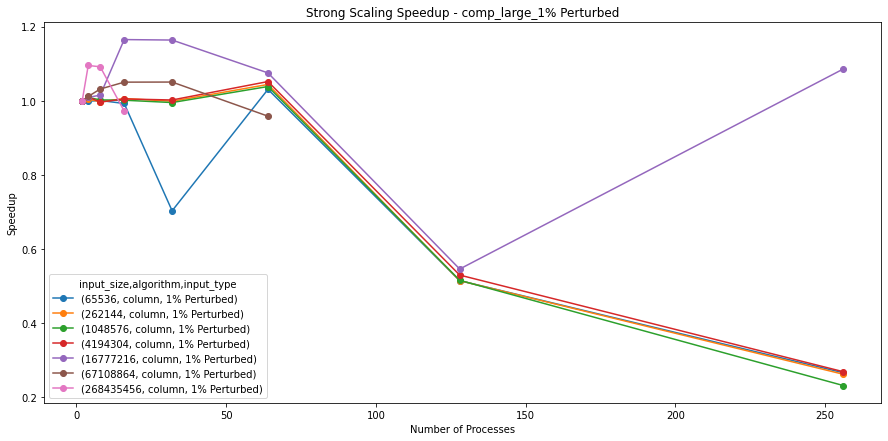

In [39]:
for node in tk.graph.traverse():
    if 'comp_large' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify

            # Plotting the speedup
            plot_pandas(
                speedup,
                title=f"Strong Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Speedup",
            )
            plt.savefig(f"Strong Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

Weak Scaling Efficiency - comp_large_Random
Weak Scaling Efficiency - comp_large_Reverse
Weak Scaling Efficiency - comp_large_Sorted
Weak Scaling Efficiency - comp_large_1% Perturbed


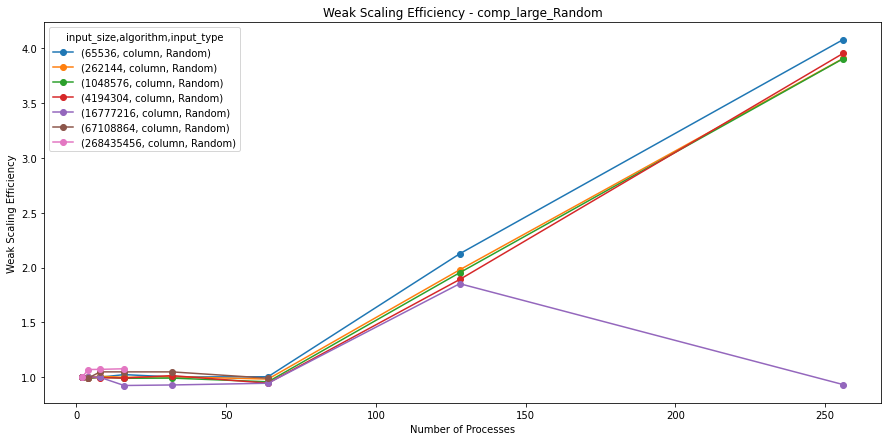

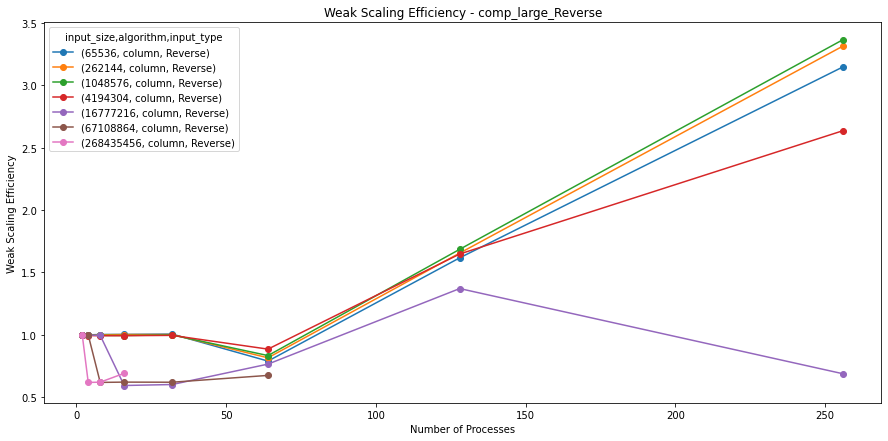

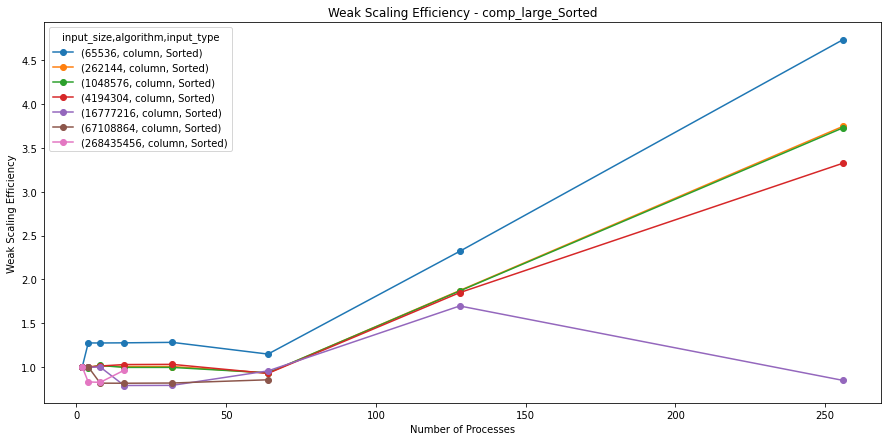

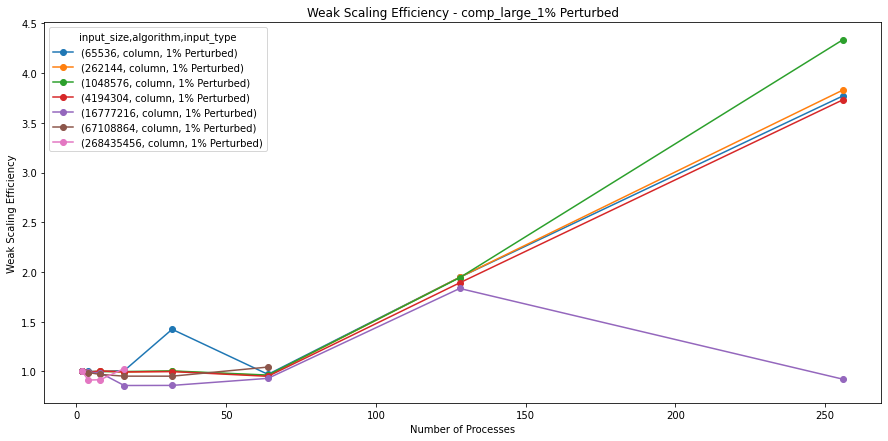

In [28]:
# Weak Scaling
# Iterate over each node in the graph
for node in tk.graph.traverse():
    if 'comp_large' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline_time = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate the weak scaling efficiency: time at process count divided by baseline time
            weak_scaling_efficiency = df.div(baseline_time)

            # Plot using the provided plot_pandas function
            plot_pandas(
                weak_scaling_efficiency,
                title=f"Weak Scaling Efficiency - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Weak Scaling Efficiency"
            )
            plt.savefig(f"Weak Scaling Efficiency - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

Weak Scaling Efficiency - main_Random
Weak Scaling Efficiency - main_Reverse
Weak Scaling Efficiency - main_Sorted
Weak Scaling Efficiency - main_1% Perturbed


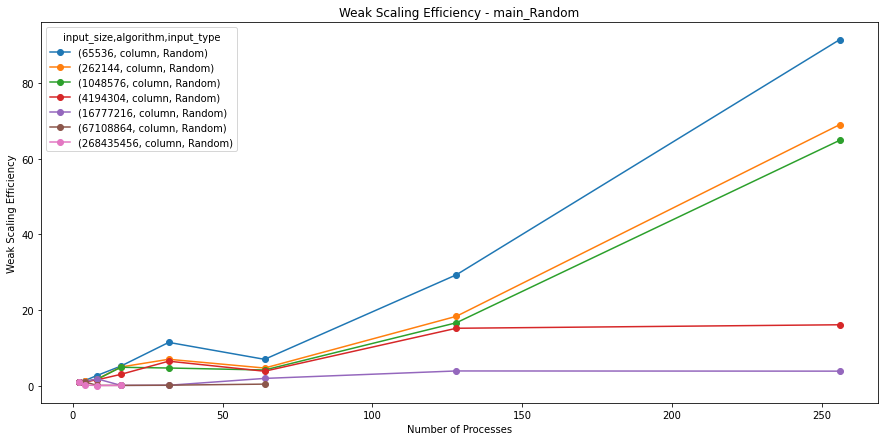

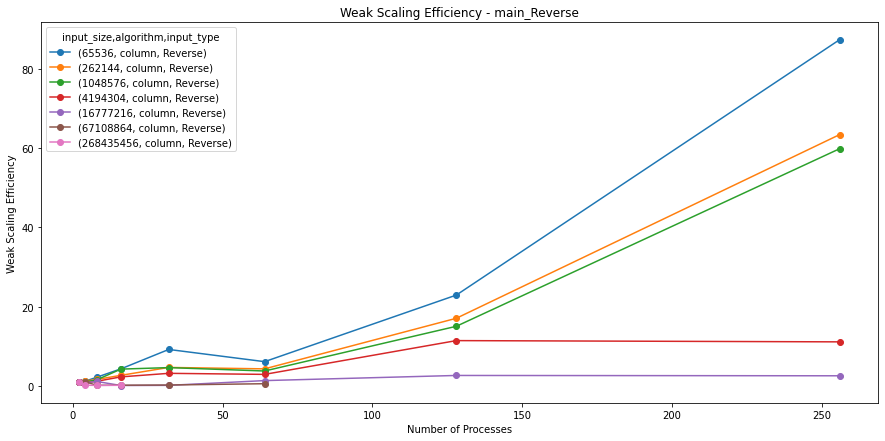

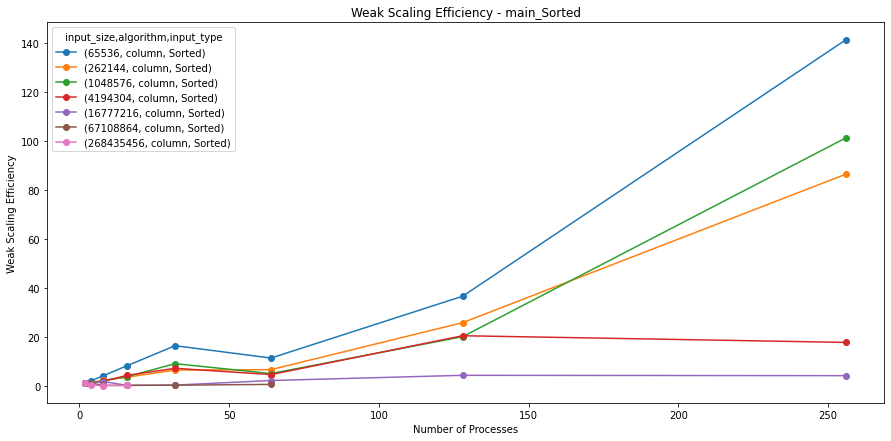

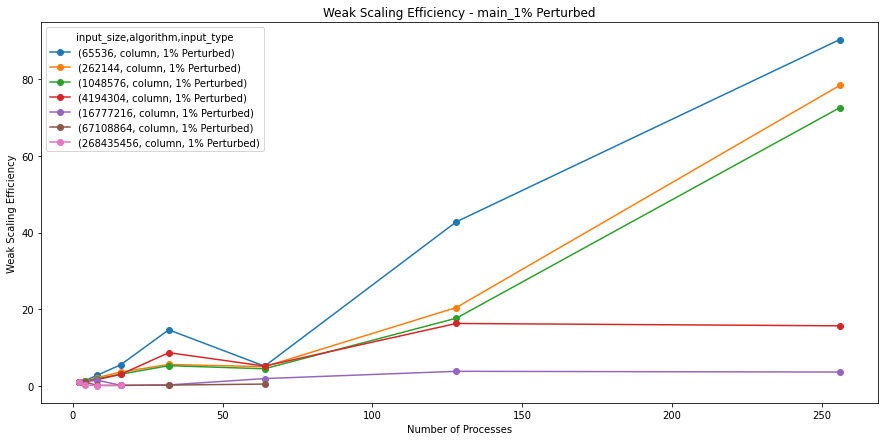

In [29]:
for node in tk.graph.traverse():
    if 'main' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline_time = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate the weak scaling efficiency: time at process count divided by baseline time
            weak_scaling_efficiency = df.div(baseline_time)

            # Plot using the provided plot_pandas function
            plot_pandas(
                weak_scaling_efficiency,
                title=f"Weak Scaling Efficiency - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Weak Scaling Efficiency"
            )
            plt.savefig(str(node.frame["name"])+"_"+str(size)+'.png', dpi=300, bbox_inches='tight')

Weak Scaling Efficiency - comm_Random
Weak Scaling Efficiency - comm_Reverse
Weak Scaling Efficiency - comm_Sorted
Weak Scaling Efficiency - comm_1% Perturbed


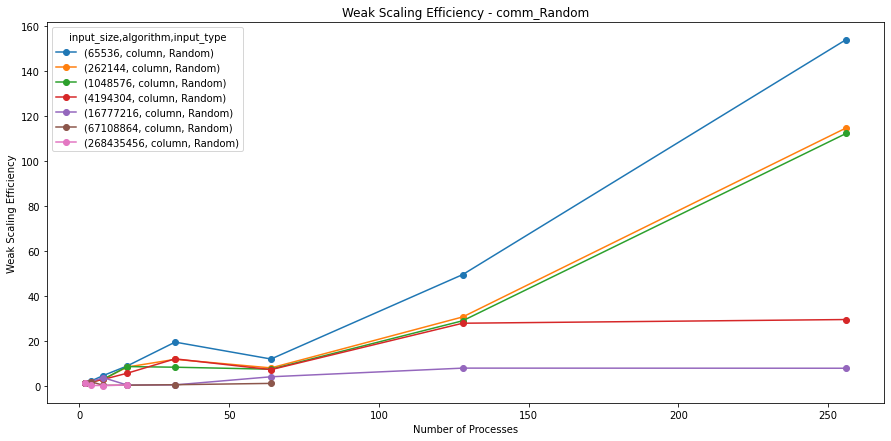

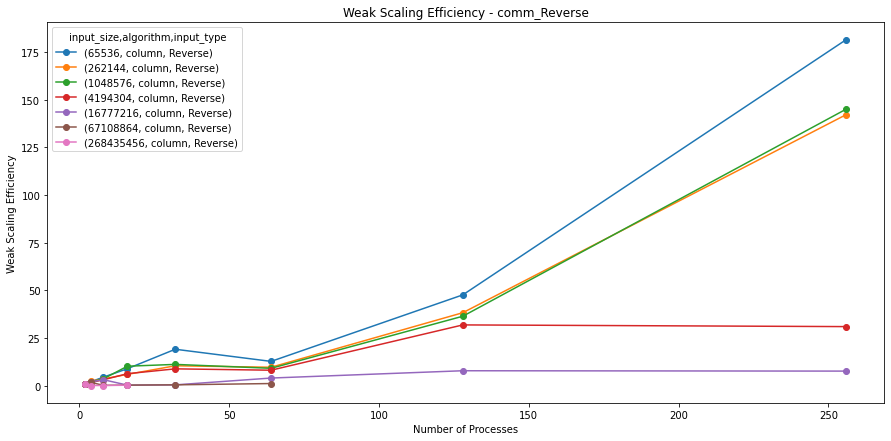

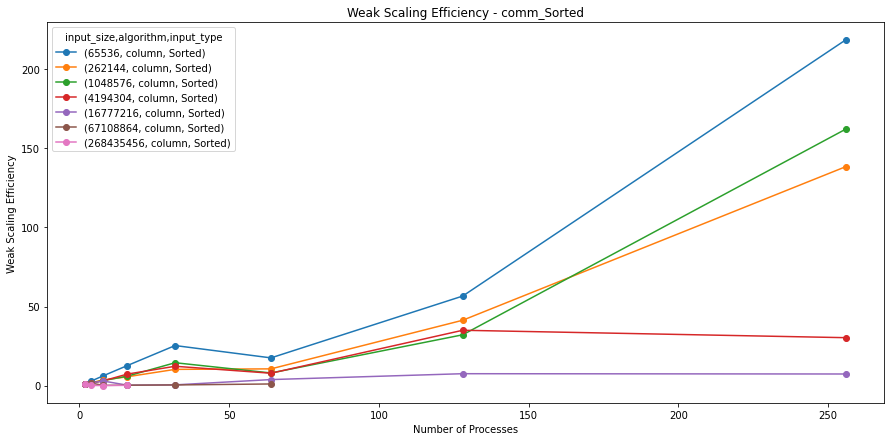

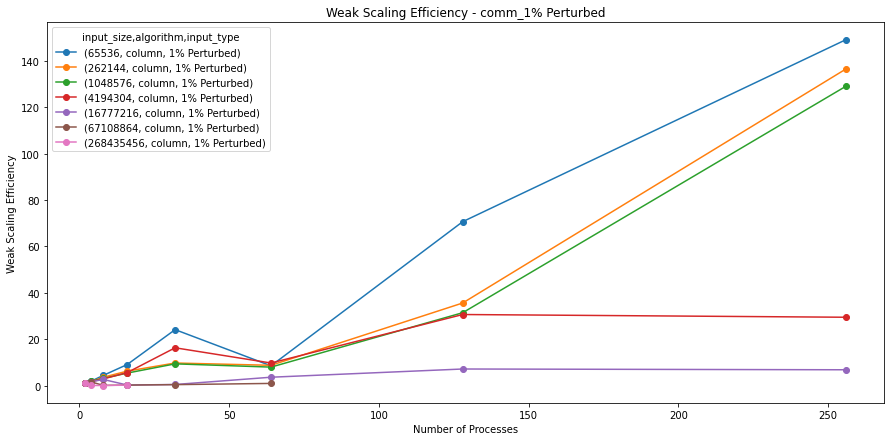

In [30]:
for node in tk.graph.traverse():
    if 'comm\',' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline_time = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate the weak scaling efficiency: time at process count divided by baseline time
            weak_scaling_efficiency = df.div(baseline_time)

            # Plot using the provided plot_pandas function
            plot_pandas(
                weak_scaling_efficiency,
                title=f"Weak Scaling Efficiency - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Weak Scaling Efficiency"
            )
            plt.savefig(str(node.frame["name"])+"_"+str(size)+'.png', dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216   67108864   \
algorithm     column    column    column    column    column     column   
input_type    Random    Random    Random    Random    Random     Random   
num_procs                                                                 
2           1.000000  1.000000  1.000000  1.000000  1.000000   1.000000   
4           0.479307  0.594651  0.584175  0.607244  0.560700   0.582673   
8           0.223022  0.358515  0.355913  0.363299  0.282357  10.022525   
16          0.114215  0.120960  0.117955  0.181348  4.281296   5.122236   
32          0.051621  0.085452  0.122115  0.083942  3.166407   2.526224   

input_size  268435456  
algorithm      column  
input_type     Random  
num_procs              
2            1.000000  
4           17.307288  
8           23.722672  
16           4.343407  
32                NaN  
Weak Scaling Speedup - comm_Random
input_size 65536     262144    1048576   4194304   16777216  67108864   \

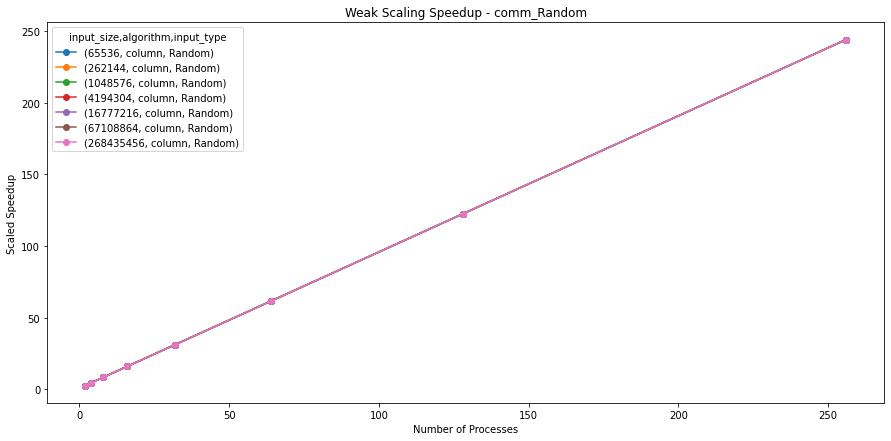

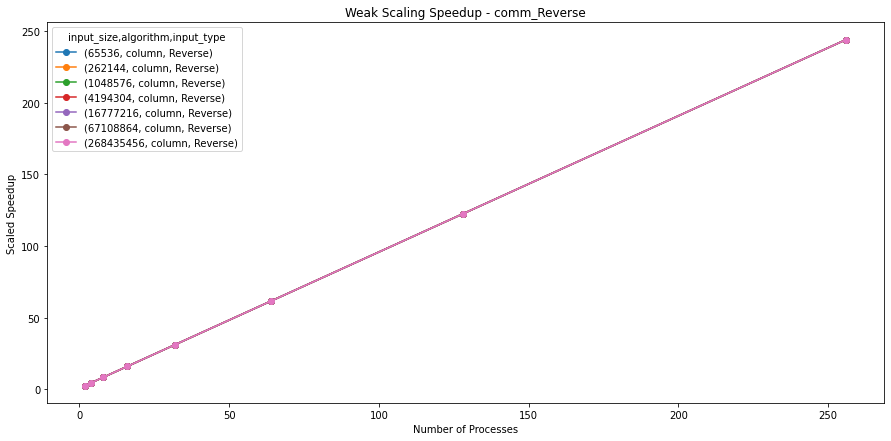

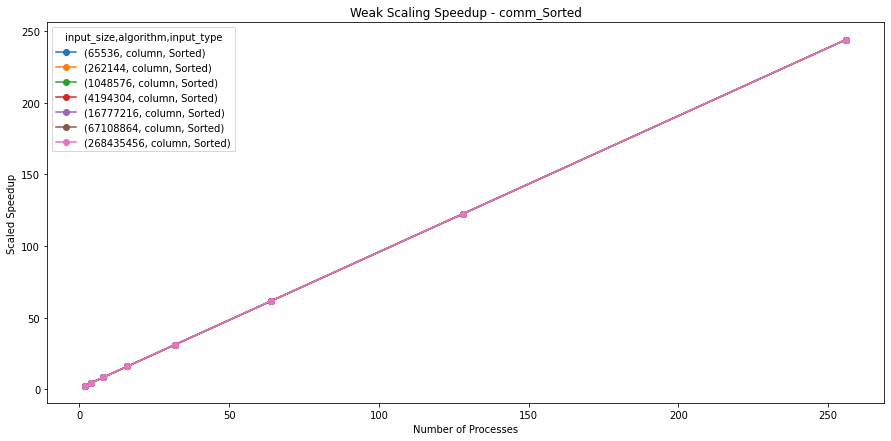

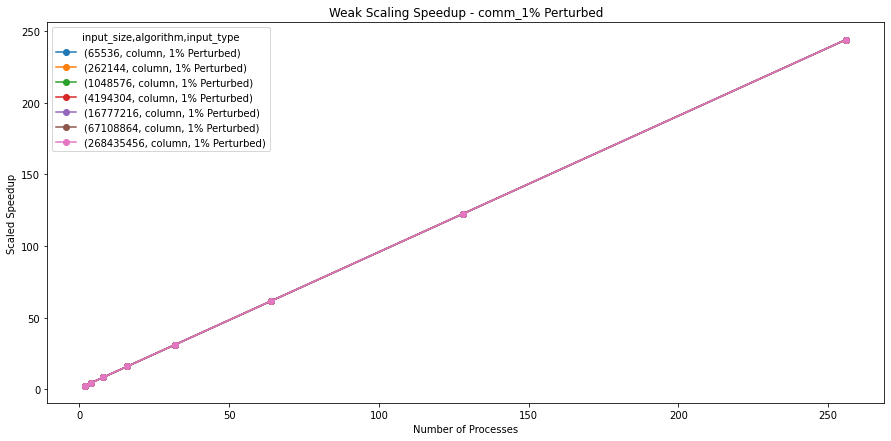

In [40]:
s = 0.80  # Define the serial fraction (adjust as necessary)
for node in tk.graph.traverse():
    if 'comm\',' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify
            
            # Calculate scaled speedup for each number of processes (N)
            for num_procs in df.index.get_level_values('num_procs').unique():
                speedup.loc[num_procs] = s + p * num_procs
            
            # Plotting the weak scaling speedup
            plot_pandas(
                speedup,
                title=f"Weak Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Scaled Speedup",
            )
            plt.savefig(f"Weak Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     column    column    column    column    column    column   
input_type    Random    Random    Random    Random    Random    Random   
num_procs                                                                
2           1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
4           0.687940  0.821038  0.831255  0.883304  0.864228  0.903207   
8           0.359907  0.558296  0.574680  0.612861  0.517876  5.554878   
16          0.190011  0.198705  0.201667  0.323582  5.466651  5.529460   
32          0.086747  0.141425  0.209735  0.152285  4.707043  4.181823   

input_size 268435456  
algorithm     column  
input_type    Random  
num_procs             
2           1.000000  
4           3.611161  
8           6.593135  
16          5.286510  
32               NaN  
Weak Scaling Speedup - main_Random
input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     col

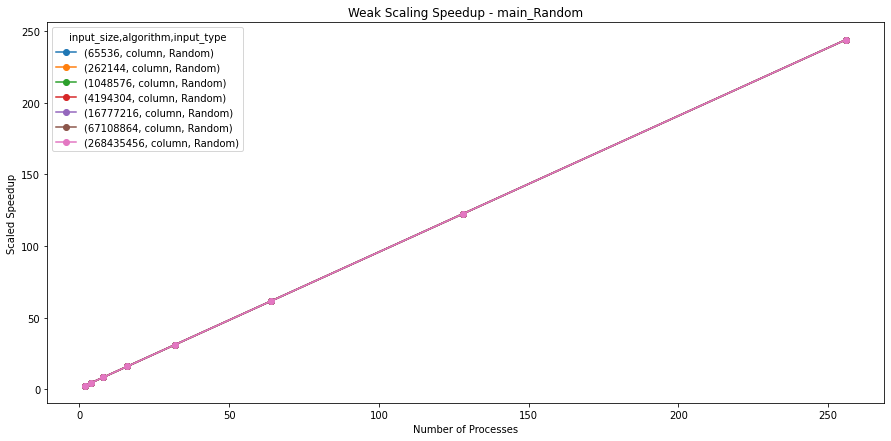

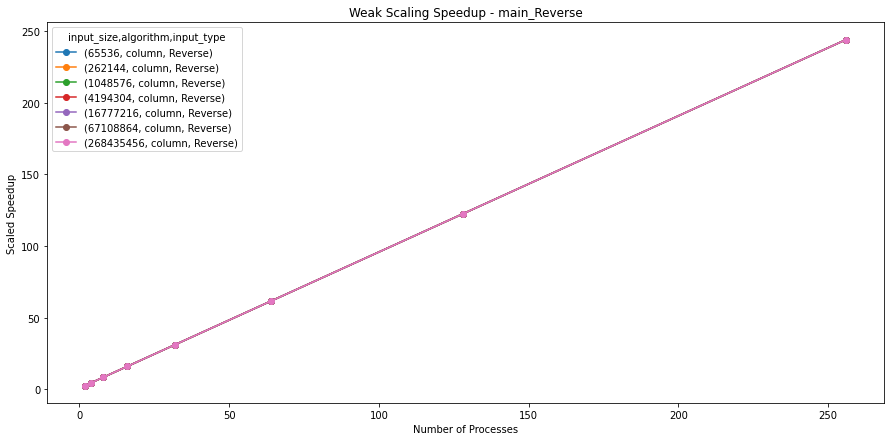

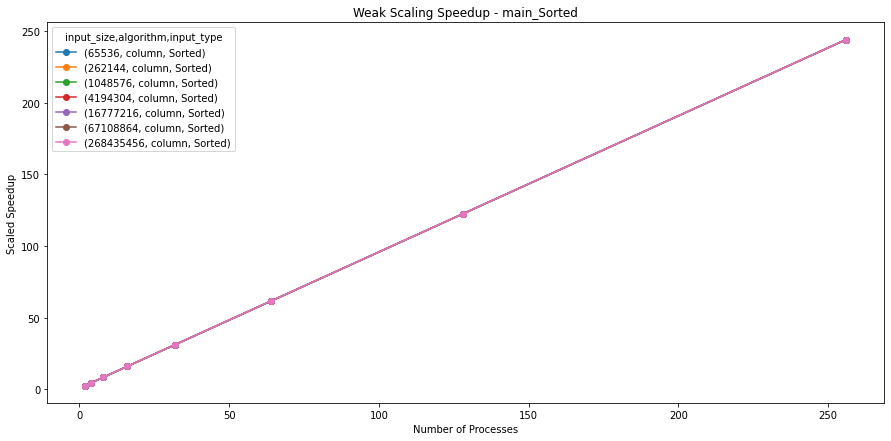

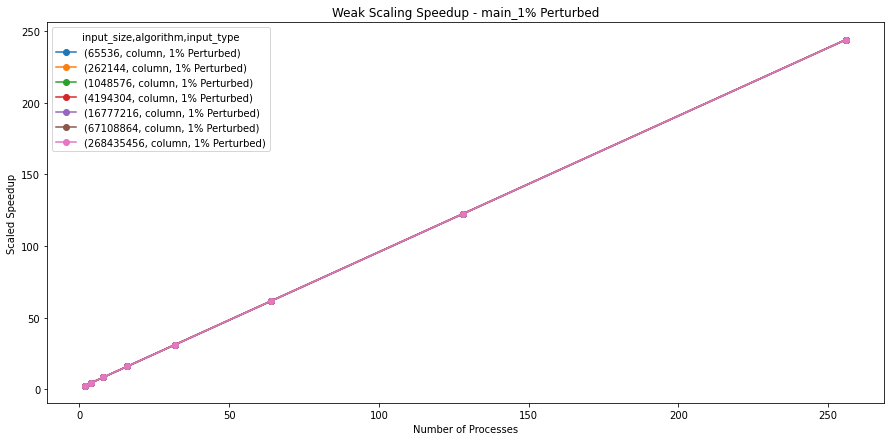

In [41]:
s = 0.80  # Define the serial fraction (adjust as necessary)
for node in tk.graph.traverse():
    if 'main' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify
            
            # Calculate scaled speedup for each number of processes (N)
            for num_procs in df.index.get_level_values('num_procs').unique():
                speedup.loc[num_procs] = s + p * num_procs
            
            # Plotting the weak scaling speedup
            plot_pandas(
                speedup,
                title=f"Weak Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Scaled Speedup",
            )
            plt.savefig(f"Weak Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')

input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm     column    column    column    column    column    column   
input_type    Random    Random    Random    Random    Random    Random   
num_procs                                                                
2           1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
4           0.999853  1.002151  1.012822  1.004032  0.995882  1.008493   
8           1.000865  0.991816  1.001048  1.005470  1.002627  0.954334   
16          0.977679  1.002346  1.010821  1.008156  1.082983  0.954416   
32          0.998421  0.996442  1.009242  0.986429  1.077240  0.954512   

input_size 268435456  
algorithm     column  
input_type    Random  
num_procs             
2           1.000000  
4           0.935374  
8           0.933887  
16          0.929218  
32               NaN  
Weak Scaling Speedup - comp_large_Random
input_size 65536     262144    1048576   4194304   16777216  67108864   \
algorithm  

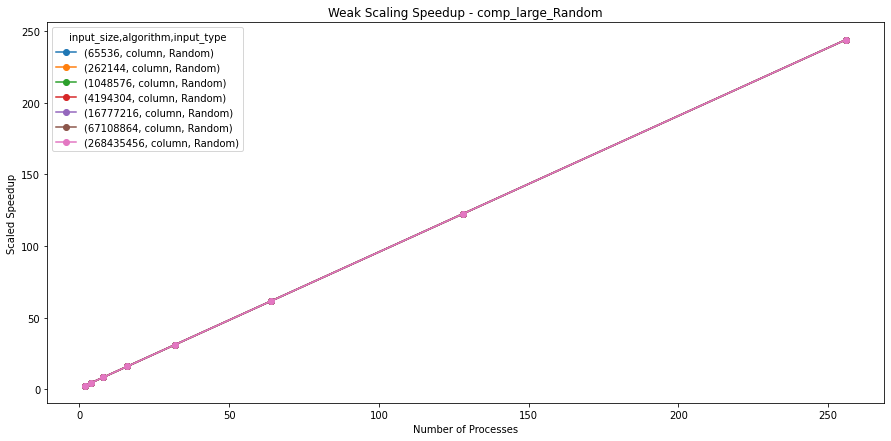

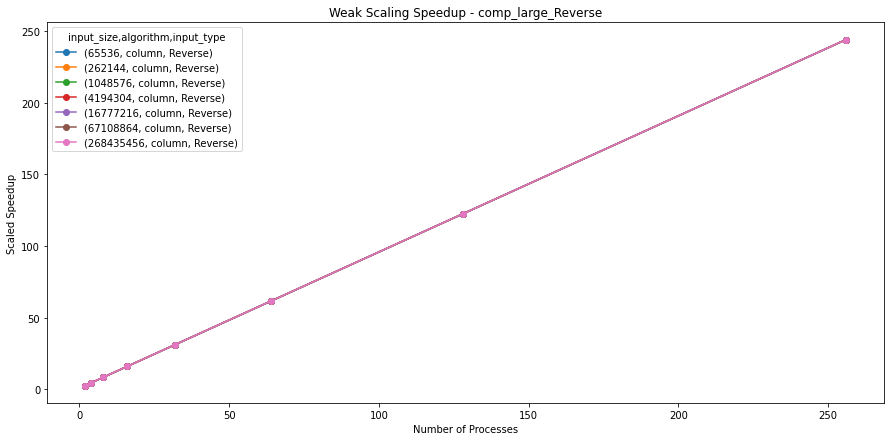

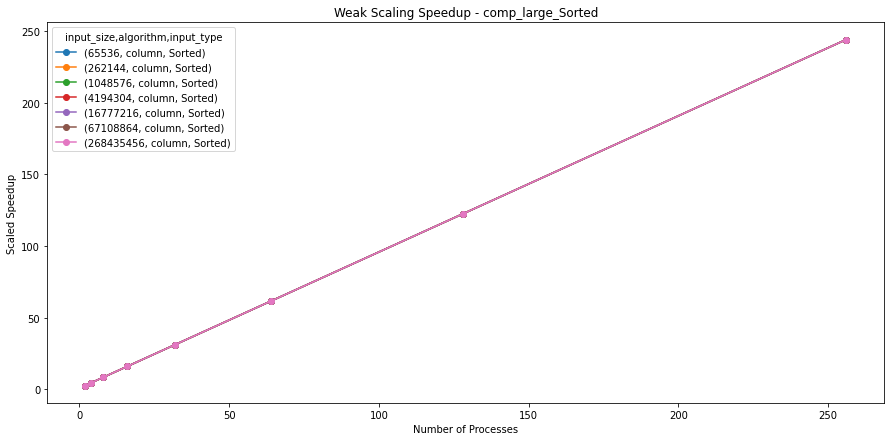

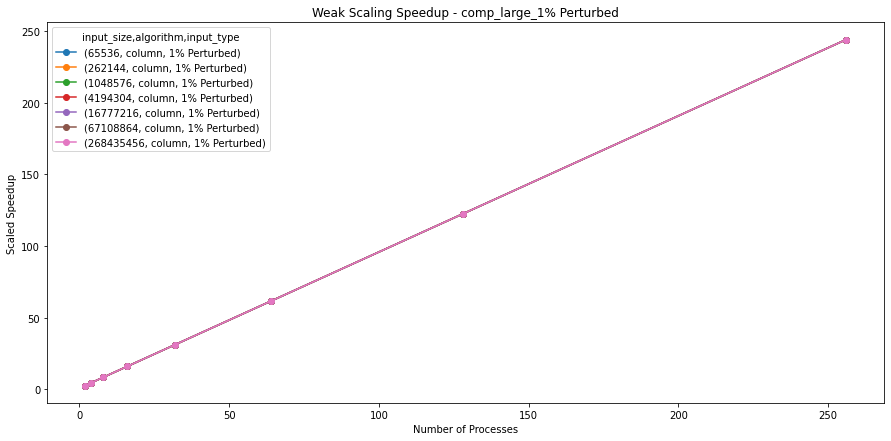

In [42]:
s = 0.80  # Define the serial fraction (adjust as necessary)
for node in tk.graph.traverse():
    if 'comp_large' in str(node):
        for input_type in inputs:
            df = tk.dataframe.loc[node, "Avg time/rank"]
            df = df.loc[df.index.get_level_values('input_type') == input_type]
            df = df.unstack(level="input_size")
            df = df.unstack(level="algorithm")
            df = df.unstack(level="input_type")

            # Ensure the baseline time is correctly extracted for the smallest number of processes (e.g., 2)
            try:
                baseline = df.loc[2]  # Get the row corresponding to 2 processes
            except KeyError:
                print(f"Baseline for 2 processes not found for {input_type}. Skipping...")
                continue

            # Calculate speedup: baseline time divided by the time for each process count
            speedup = baseline / df

            # Check if the speedup values are being calculated correctly
            print(speedup.head())  # Print the first few values to verify
            
            # Calculate scaled speedup for each number of processes (N)
            for num_procs in df.index.get_level_values('num_procs').unique():
                speedup.loc[num_procs] = s + p * num_procs
            
            # Plotting the weak scaling speedup
            plot_pandas(
                speedup,
                title=f"Weak Scaling Speedup - {node.frame['name']}_{input_type}",
                xlabel="Number of Processes",
                ylabel="Scaled Speedup",
            )
            plt.savefig(f"Weak Scaling Speedup - {node.frame['name']}_{input_type}.png", dpi=300, bbox_inches='tight')